In [1]:
#import the appropriate libraries-packages
import pandas as pd
import numpy as np
import warnings
warnings.filterwarnings("ignore")
from pandas import read_excel
import matplotlib.pyplot as plt
from sklearn.decomposition import PCA
from mpl_toolkits.mplot3d import Axes3D
from numpy import *
import matplotlib.cm as cm
import seaborn as sns
from scipy import stats
from pylab import rcParams
from sklearn import metrics
from sklearn.metrics import f1_score
from sklearn.metrics import classification_report
import plotly.graph_objs as go
import plotly.offline as py


# Read the data

In the below dataset there is a column 'Target_by_med' with binary values 0-1. This column represents the label "Churn or no churn" for the clients. This column matches the value 0 with no churn clients whereas mathes the value 1 to churn clients. 

In [2]:
data_classification=pd.read_csv('data_for_classific_median_fromubuntu.csv',sep=",")
data_classification

,client_username_s,countt,recency,frequency,max_dist,average_trans_dur,diff_maxd_mind_days,start_trans_end_data,Cluster,Target_by_med
0,-1383360085895621481,7128.0,0.0,213.0,6.0,1.25,266.0,266.0,0,0
1,-4373917140025030743,437.0,7.0,26.0,98.0,15.00,390.0,397.0,0,1
2,8138114728915753073,2780.0,6.0,136.0,27.0,5.29,720.0,726.0,0,0
3,3238105438798080237,2050.0,1.0,154.0,31.0,4.69,723.0,724.0,0,0
4,6715359518456271901,1786.0,2.0,40.0,29.0,9.90,396.0,398.0,0,0
5,-5699689628182849411,4630.0,0.0,307.0,22.0,1.84,564.0,564.0,0,0
6,3738582637858980585,1818.0,74.0,75.0,58.0,2.79,209.0,283.0,0,0
7,1928064594810315272,2313.0,11.0,121.0,18.0,2.35,284.0,295.0,0,0
8,-4025425347570620616,4210.0,0.0,304.0,16.0,2.38,722.0,722.0,0,0
9,-5436079748649137911,2091.0,62.0,91.0,102.0,7.33,667.0,729.0,0,0


In [3]:
data_classification_cl0=pd.read_csv('data_for_classific_cl0median_fromubuntu.csv',sep=",")
data_classification_cl0

,client_username_s,countt,recency,frequency,max_dist,average_trans_dur,diff_maxd_mind_days,start_trans_end_data,Cluster,Target_by_med
0,-1383360085895621481,7128.0,0.0,213.0,6.0,1.25,266.0,266.0,0,0
1,-4373917140025030743,437.0,7.0,26.0,98.0,15.00,390.0,397.0,0,1
2,8138114728915753073,2780.0,6.0,136.0,27.0,5.29,720.0,726.0,0,0
3,3238105438798080237,2050.0,1.0,154.0,31.0,4.69,723.0,724.0,0,0
4,6715359518456271901,1786.0,2.0,40.0,29.0,9.90,396.0,398.0,0,0
5,-5699689628182849411,4630.0,0.0,307.0,22.0,1.84,564.0,564.0,0,0
6,3738582637858980585,1818.0,74.0,75.0,58.0,2.79,209.0,283.0,0,0
7,1928064594810315272,2313.0,11.0,121.0,18.0,2.35,284.0,295.0,0,0
8,-4025425347570620616,4210.0,0.0,304.0,16.0,2.38,722.0,722.0,0,0
9,-5436079748649137911,2091.0,62.0,91.0,102.0,7.33,667.0,729.0,0,0


In [4]:
data_classification_cl2=pd.read_csv('data_for_classific_cl2median_fromubuntu.csv',sep=",")
data_classification_cl2

,client_username_s,countt,recency,frequency,max_dist,average_trans_dur,diff_maxd_mind_days,start_trans_end_data,Cluster,Target_by_med
0,-8165052955687777117,574.0,2.0,42.0,28.0,5.33,224.0,226.0,2,0
1,2668027758950168641,584.0,12.0,21.0,30.0,12.10,254.0,266.0,2,0
2,9177886260668941966,386.0,16.0,16.0,77.0,10.06,161.0,177.0,2,1
3,-3392950503654926158,1195.0,1.0,76.0,20.0,3.43,261.0,262.0,2,0
4,6540297600479042960,230.0,107.0,16.0,84.0,10.44,167.0,274.0,2,1
5,-993977797047993401,412.0,8.0,37.0,30.0,5.30,196.0,204.0,2,0
6,2231443412108348058,300.0,109.0,11.0,56.0,9.36,103.0,212.0,2,1
7,7821032924451870851,12.0,89.0,4.0,41.0,17.75,71.0,160.0,2,0
8,2983104271085831019,693.0,20.0,56.0,23.0,3.34,187.0,207.0,2,0
9,1830882992714593335,1026.0,0.0,50.0,30.0,4.30,215.0,215.0,2,0


In [5]:
data_classification['client_username_s'] = data_classification['client_username_s'].astype(str)


In [6]:
data_classification_cl0['client_username_s'] = data_classification_cl0['client_username_s'].astype(str)


In [7]:
data_classification_cl2['client_username_s'] = data_classification_cl2['client_username_s'].astype(str)


In [8]:
data_classification.columns

Index(['client_username_s', 'countt', 'recency', 'frequency', 'max_dist',
       'average_trans_dur', 'diff_maxd_mind_days', 'start_trans_end_data',
       'Cluster', 'Target_by_med'],
      dtype='object')

In [9]:
data_classification_cl0.columns

Index(['client_username_s', 'countt', 'recency', 'frequency', 'max_dist',
       'average_trans_dur', 'diff_maxd_mind_days', 'start_trans_end_data',
       'Cluster', 'Target_by_med'],
      dtype='object')

In [10]:
data_classification_cl2.columns

Index(['client_username_s', 'countt', 'recency', 'frequency', 'max_dist',
       'average_trans_dur', 'diff_maxd_mind_days', 'start_trans_end_data',
       'Cluster', 'Target_by_med'],
      dtype='object')

In [11]:
data_classification.dtypes

client_username_s        object
countt                  float64
recency                 float64
frequency               float64
max_dist                float64
average_trans_dur       float64
diff_maxd_mind_days     float64
start_trans_end_data    float64
Cluster                   int64
Target_by_med             int64
dtype: object

In [12]:
data_classification_cl0.dtypes

client_username_s        object
countt                  float64
recency                 float64
frequency               float64
max_dist                float64
average_trans_dur       float64
diff_maxd_mind_days     float64
start_trans_end_data    float64
Cluster                   int64
Target_by_med             int64
dtype: object

In [13]:
data_classification_cl2.dtypes

client_username_s        object
countt                  float64
recency                 float64
frequency               float64
max_dist                float64
average_trans_dur       float64
diff_maxd_mind_days     float64
start_trans_end_data    float64
Cluster                   int64
Target_by_med             int64
dtype: object

## General view of the data

## ALL DATA

In [15]:
data_classification['Target_by_med'].value_counts()

0    628548
1    160067
Name: Target_by_med, dtype: int64

In [16]:
print('The no churn clients are '+str(data_classification['Target_by_med'].value_counts()[0]) +' whereas \nthe churn clients are ' + str(data_classification['Target_by_med'].value_counts()[1]))


The no churn clients are 628548 whereas 
the churn clients are 160067


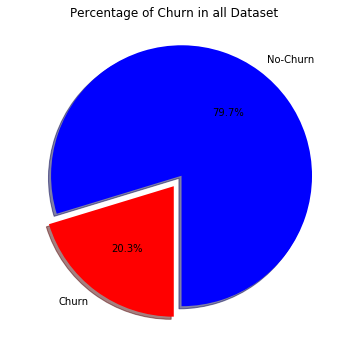

In [17]:
# Data to plot
labels='No-Churn','Churn'
explode = (0.1, 0) #0.1 means that we want to be cut off the clice
sizes = data_classification['Target_by_med'].value_counts(sort = True)
colors = ["blue","red"] 
rcParams['figure.figsize'] = 6,6
# Plot
plt.pie(sizes, explode=explode, labels=labels, colors=colors,
        autopct='%1.1f%%', shadow=True, startangle=270,)
plt.title('Percentage of Churn in all Dataset')
plt.show()

In [18]:
print ("Rows     : " ,data_classification.shape[0])
print ("Columns  : " ,data_classification.shape[1])
print ("\nFeatures : \n" ,data_classification.columns.tolist())
print ("\nMissing values :  ", data_classification.isnull().sum().values.sum())
print ("\nUnique values :  \n",data_classification.nunique())

Rows     :  788615
Columns  :  10

Features : 
 ['client_username_s', 'countt', 'recency', 'frequency', 'max_dist', 'average_trans_dur', 'diff_maxd_mind_days', 'start_trans_end_data', 'Cluster', 'Target_by_med']

Missing values :   0

Unique values :  
 client_username_s       788615
countt                    8638
recency                    410
frequency                  364
max_dist                   402
average_trans_dur         3631
diff_maxd_mind_days        729
start_trans_end_data       607
Cluster                      2
Target_by_med                2
dtype: int64


## Summary (interactive)

In [19]:
summary = (data_classification.
           describe().transpose().reset_index())

summary = summary.rename(columns = {"index" : "feature"})
summary = np.around(summary,3)

val_lst = [summary['feature'], summary['count'],
           summary['mean'],summary['std'],
           summary['min'], summary['25%'],
           summary['50%'], summary['75%'], summary['max']]

trace  = go.Table(header = dict(values = summary.columns.tolist(),
                                line = dict(color = ['#506784']),
                                fill = dict(color = ['#119DFF']),
                               ),
                  cells  = dict(values = val_lst,
                                line = dict(color = ['#506784']),
                                fill = dict(color = ["lightgrey",'#F5F8FF'])
                               ),
                  columnwidth = [200,60,100,100,60,60,80,80,80])
layout = go.Layout(dict(title = "Summary Table for all variabls-features"))
figure = go.Figure(data=[trace],layout=layout)
py.iplot(figure)

### Histogram (Interactive) from plotly

https://www.kaggle.com/pavanraj159/telecom-customer-churn-prediction?fbclid=IwAR3PSmQmFHt5lOjWP8crrC4guYBpHWUSS2kseflqhkqFOp4MuKn61a9ThUg

In [20]:
#function  for histogram for customer attrition types

#Separating churn and non churn customers
churn     = data_classification[data_classification["Target_by_med"] == 1]
not_churn = data_classification[data_classification["Target_by_med"] == 0]


def histogram(column) :
    
    
    trace1 = go.Histogram(x  = not_churn[column],
                          histnorm= "percent",
                          name = "Non Churn Customers",
                          marker = dict(line = dict(width = .5,
                                                    color = "blue"
                                                    )
                                        ),
                         opacity = .9 
                         ) 
    
    trace2 = go.Histogram(x  = churn[column],
                          histnorm = "percent",
                          name = "churn customers",
                          marker = dict(line = dict(width = .5,
                                              color = "red"
                                             )
                                 ),
                          opacity = .9
                         )
    
    data = [trace1,trace2]
    layout = go.Layout(dict(title =column + " distribution in customer attrition ",
                            plot_bgcolor  = "rgb(243,243,243)",
                            paper_bgcolor = "rgb(243,243,243)",
                            xaxis = dict(gridcolor = 'rgb(255, 255, 255)',
                                             title = column,
                                             zerolinewidth=1,
                                             ticklen=5,
                                             gridwidth=2
                                            ),
                            yaxis = dict(gridcolor = 'rgb(255, 255, 255)',
                                             title = "percent",
                                             zerolinewidth=1,
                                             ticklen=5,
                                             gridwidth=2
                                            ),
                           )
                      )
    fig  = go.Figure(data=data,layout=layout)
    
    py.iplot(fig)

In [21]:
#apply the function
column='max_dist'
hist1=histogram(column)
